# TransReID - Qualitative Retrieval Results on AG-ReID.v2

Retrieval visualization across all 4 evaluation protocols:
- **Exp1:** Aerial → CCTV (A→C)
- **Exp2:** Aerial → Wearable (A→W)
- **Exp4:** CCTV → Aerial (C→A)
- **Exp5:** Wearable → Aerial (W→A)

For each protocol: query image + Top-20 retrieved gallery images, sorted from **Easy → Hard** by AP.

In [17]:
import os, sys
import numpy as np
import torch
import torch.nn.functional as F
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
from PIL import Image
from collections import defaultdict

sys.path.insert(0, os.path.dirname(os.path.abspath('__file__')))
from reid_advance.config import TransReIDConfig
from reid_advance.pipelines.transreid import TransReIDSmall
from reid_advance.evaluation import extract_features, evaluate_rank
from reid_advance.runtime import build_eval_loaders, resolve_device

plt.rcParams.update({'font.size': 10})
print('Imports OK')

Imports OK


In [18]:
# Load model once
cfg = TransReIDConfig()
resolve_device(cfg)

checkpoint_path = os.path.join(cfg.output_dir, cfg.checkpoint_name)
state = torch.load(checkpoint_path, map_location=cfg.device, weights_only=False)
print(f"Checkpoint: epoch {state['epoch']}, Rank-1 {state['rank1']:.2%}, mAP {state['mAP']:.2%}")

model = TransReIDSmall(cfg, state['train_identity_count']).to(cfg.device)
model.load_state_dict(state['model'])
model.eval()
print('Model loaded.')

Checkpoint: epoch 125, Rank-1 83.74%, mAP 75.47%
Model loaded.


In [19]:
PROTOCOLS = {
    'exp1_aerial_to_cctv.txt':       'A → C',
    'exp2_aerial_to_wearable.txt':   'A → W',
    'exp4_cctv_to_aerial.txt':       'C → A',
    'exp5_wearable_to_aerial.txt':   'W → A',
}

def evaluate_protocol(model, cfg, protocol_file):
    """Run full evaluation for one protocol, return all needed data."""
    cfg_copy = TransReIDConfig()
    cfg_copy.device = cfg.device
    cfg_copy.eval_txt_file = protocol_file
    cfg_copy.eval_batch_size = 64
    cfg_copy.strict_dataset_integrity = False  # some protocols have different ID counts

    query_loader, gallery_loader = build_eval_loaders(cfg_copy)

    query_feats, query_pids, query_camids = extract_features(
        model, query_loader, cfg.device, flip_tta=cfg.flip_tta
    )
    gallery_feats, gallery_pids, gallery_camids = extract_features(
        model, gallery_loader, cfg.device, flip_tta=cfg.flip_tta
    )

    distmat = (1.0 - query_feats @ gallery_feats.t()).numpy()
    cmc, mAP = evaluate_rank(distmat, query_pids, gallery_pids, query_camids, gallery_camids)

    # Per-query AP
    indices_sorted = np.argsort(distmat, axis=1)
    matches = (gallery_pids[indices_sorted] == query_pids[:, np.newaxis]).astype(np.int32)
    per_query_ap = []
    valid_query_indices = []

    for q_idx in range(len(query_pids)):
        q_pid, q_camid = query_pids[q_idx], query_camids[q_idx]
        order = indices_sorted[q_idx]
        remove = (gallery_pids[order] == q_pid) & (gallery_camids[order] == q_camid)
        raw_cmc = matches[q_idx][~remove]
        if not np.any(raw_cmc):
            continue
        num_rel = raw_cmc.sum()
        tmp = raw_cmc.cumsum()
        tmp = np.array([x / (i + 1.0) for i, x in enumerate(tmp)]) * raw_cmc
        ap = tmp.sum() / num_rel
        per_query_ap.append(ap)
        valid_query_indices.append(q_idx)

    query_paths = [item[0] for item in query_loader.dataset.items]
    gallery_paths = [item[0] for item in gallery_loader.dataset.items]

    return {
        'cmc': cmc, 'mAP': mAP,
        'distmat': distmat,
        'query_pids': query_pids, 'gallery_pids': gallery_pids,
        'query_camids': query_camids, 'gallery_camids': gallery_camids,
        'per_query_ap': np.array(per_query_ap),
        'valid_query_indices': np.array(valid_query_indices),
        'query_paths': query_paths, 'gallery_paths': gallery_paths,
    }

In [20]:
# Evaluate all protocols
results = {}
for protocol_file, protocol_name in PROTOCOLS.items():
    print(f'\nEvaluating {protocol_name} ({protocol_file})...')
    results[protocol_name] = evaluate_protocol(model, cfg, protocol_file)
    r = results[protocol_name]
    print(f'  Rank-1: {r["cmc"][0]:.2%} | Rank-5: {r["cmc"][4]:.2%} | '
          f'Rank-10: {r["cmc"][9]:.2%} | Rank-20: {r["cmc"][19]:.2%} | mAP: {r["mAP"]:.2%}')


Evaluating A → C (exp1_aerial_to_cctv.txt)...
Dataset audit | train identity scheme=P+T+A | query=2,356/534 IDs | gallery=6,347/534 IDs


  Rank-1: 83.74% | Rank-5: 90.87% | Rank-10: 93.46% | Rank-20: 94.78% | mAP: 75.47%

Evaluating A → W (exp2_aerial_to_wearable.txt)...
Dataset audit | train identity scheme=P+T+A | query=2,209/519 IDs | gallery=12,912/519 IDs


  Rank-1: 84.74% | Rank-5: 90.31% | Rank-10: 92.30% | Rank-20: 94.25% | mAP: 76.55%

Evaluating C → A (exp4_cctv_to_aerial.txt)...
Dataset audit | train identity scheme=P+T+A | query=1,811/534 IDs | gallery=14,362/534 IDs


  Rank-1: 81.28% | Rank-5: 87.96% | Rank-10: 89.90% | Rank-20: 93.04% | mAP: 73.22%

Evaluating W → A (exp5_wearable_to_aerial.txt)...
Dataset audit | train identity scheme=P+T+A | query=2,340/519 IDs | gallery=12,568/519 IDs


  Rank-1: 79.57% | Rank-5: 87.99% | Rank-10: 90.98% | Rank-20: 92.86% | mAP: 72.54%


## 1. Performance Table (All Protocols)

Protocol     Rank-1   Rank-5  Rank-10  Rank-20      mAP
------------------------------------------------------
A → C       83.74%  90.87%  93.46%  94.78%  75.47%
A → W       84.74%  90.31%  92.30%  94.25%  76.55%
C → A       81.28%  87.96%  89.90%  93.04%  73.22%
W → A       79.57%  87.99%  90.98%  92.86%  72.54%


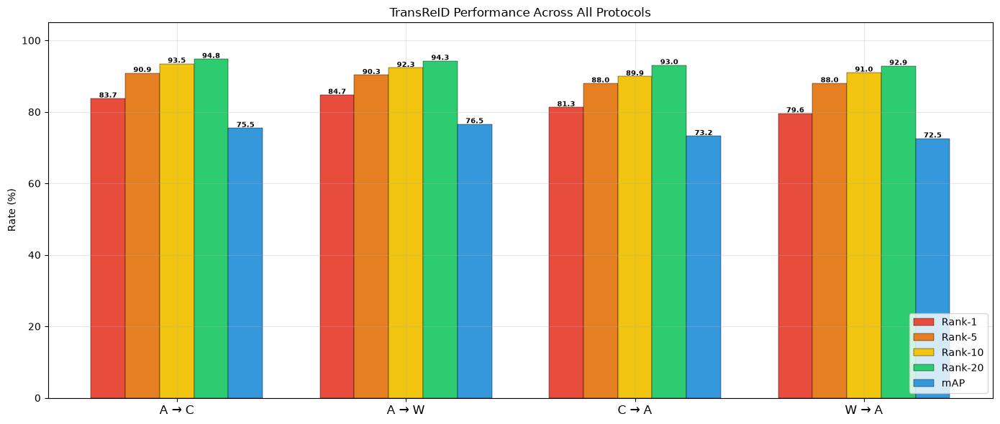

In [22]:
# Summary table
print(f"{'Protocol':<10} {'Rank-1':>8} {'Rank-5':>8} {'Rank-10':>8} {'Rank-20':>8} {'mAP':>8}")
print('-' * 54)
for name, r in results.items():
    print(f"{name:<10} {r['cmc'][0]:>7.2%} {r['cmc'][4]:>7.2%} {r['cmc'][9]:>7.2%} {r['cmc'][19]:>7.2%} {r['mAP']:>7.2%}")

# Bar chart comparison
fig, ax = plt.subplots(figsize=(14, 6))
protocol_names = list(results.keys())
x = np.arange(len(protocol_names))
width = 0.15
metrics = ['Rank-1', 'Rank-5', 'Rank-10', 'Rank-20', 'mAP']
colors = ['#e74c3c', '#e67e22', '#f1c40f', '#2ecc71', '#3498db']
rank_indices = [0, 4, 9, 19]

for i, (metric, color) in enumerate(zip(metrics, colors)):
    if metric == 'mAP':
        values = [results[n]['mAP'] * 100 for n in protocol_names]
    else:
        values = [results[n]['cmc'][rank_indices[i]] * 100 for n in protocol_names]
    bars = ax.bar(x + i * width, values, width, label=metric, color=color, edgecolor='black', linewidth=0.3)
    for bar, val in zip(bars, values):
        ax.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.3,
                f'{val:.1f}', ha='center', fontsize=7, fontweight='bold')

ax.set_xticks(x + width * 2)
ax.set_xticklabels(protocol_names, fontsize=12)
ax.set_ylabel('Rate (%)')
ax.set_title('TransReID Performance Across All Protocols')
ax.legend(loc='lower right')
ax.set_ylim(0, 105)
plt.tight_layout()
plt.savefig('outputs/transreid/all_protocols_comparison.png', dpi=150, bbox_inches='tight')
plt.show()

## 2. CMC Curves (All Protocols)

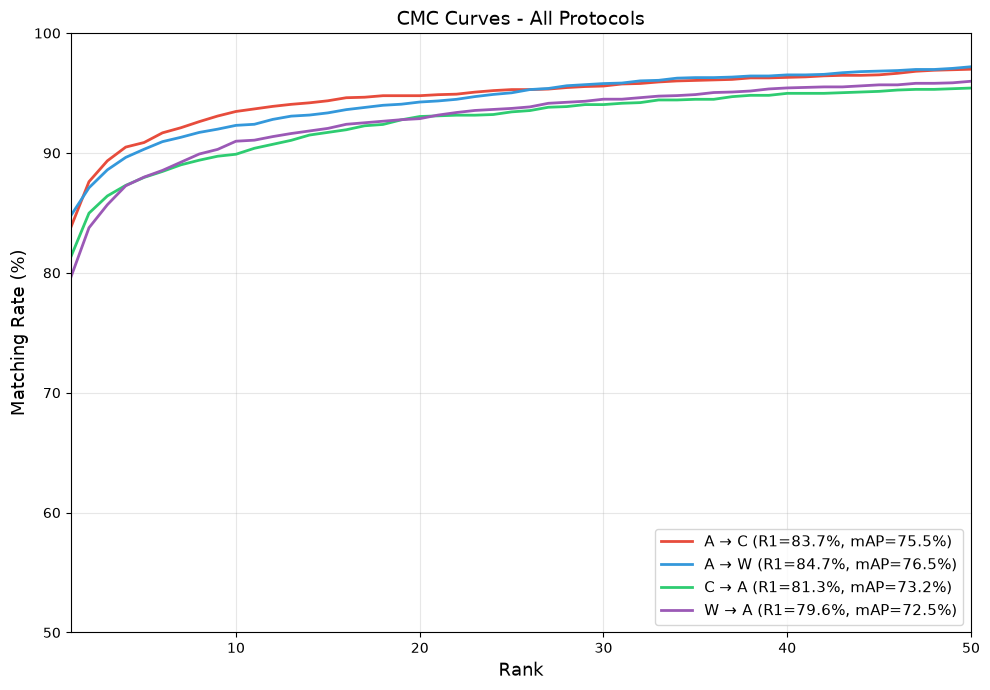

In [23]:
fig, ax = plt.subplots(figsize=(10, 7))
colors_line = ['#e74c3c', '#3498db', '#2ecc71', '#9b59b6']

for (name, r), color in zip(results.items(), colors_line):
    ranks = np.arange(1, 51)
    ax.plot(ranks, r['cmc'][:50] * 100, linewidth=2, color=color,
            label=f"{name} (R1={r['cmc'][0]:.1%}, mAP={r['mAP']:.1%})")

ax.set_xlabel('Rank', fontsize=13)
ax.set_ylabel('Matching Rate (%)', fontsize=13)
ax.set_title('CMC Curves - All Protocols', fontsize=14)
ax.set_xlim(1, 50)
ax.set_ylim(50, 100)
ax.legend(fontsize=11, loc='lower right')
ax.grid(True, alpha=0.3)
plt.tight_layout()
plt.savefig('outputs/transreid/cmc_all_protocols.png', dpi=150, bbox_inches='tight')
plt.show()

## 3. Retrieval Visualization (Top-20, Easy → Hard)

For each protocol, show retrieval results sorted from **easiest** (highest AP) to **hardest** (lowest AP).
- Green border = correct match
- Red border = wrong match

In [28]:
def show_retrieval_row(query_idx, r, top_k=20, ax_row=None, row_label=''):
    """Draw one retrieval row: query + top-k gallery on given axes."""
    q_pid = r['query_pids'][query_idx]
    q_camid = r['query_camids'][query_idx]
    order = np.argsort(r['distmat'][query_idx])

    # Filter junk
    valid = []
    for g_idx in order:
        if r['gallery_pids'][g_idx] == q_pid and r['gallery_camids'][g_idx] == q_camid:
            continue
        valid.append(g_idx)
        if len(valid) >= top_k:
            break

    # Query
    q_img = Image.open(r['query_paths'][query_idx]).convert('RGB').resize((64, 128))
    ax_row[0].imshow(q_img)
    ax_row[0].set_title('Query', fontsize=7, color='blue', fontweight='bold')
    ax_row[0].axis('off')
    for spine in ax_row[0].spines.values():
        spine.set_visible(True)
        spine.set_edgecolor('blue')
        spine.set_linewidth(2)

    # Label on left
    if row_label:
        ax_row[0].set_ylabel(row_label, fontsize=8, rotation=0, labelpad=40, va='center')

    # Gallery top-k
    for i, g_idx in enumerate(valid):
        g_img = Image.open(r['gallery_paths'][g_idx]).convert('RGB').resize((64, 128))
        ax_row[i + 1].imshow(g_img)
        is_match = r['gallery_pids'][g_idx] == q_pid
        color = '#2ecc71' if is_match else '#e74c3c'
        ax_row[i + 1].axis('off')
        for spine in ax_row[i + 1].spines.values():
            spine.set_visible(True)
            spine.set_edgecolor(color)
            spine.set_linewidth(2)

    # Fill remaining axes if fewer than top_k
    for i in range(len(valid) + 1, len(ax_row)):
        ax_row[i].axis('off')

In [29]:
def visualize_protocol_retrieval(protocol_name, r, n_examples=8, top_k=20, save_path=None):
    """
    Show n_examples retrieval results sorted from easy to hard.
    Each row: query + top-20 gallery images.
    """
    sorted_by_ap = np.argsort(r['per_query_ap'])[::-1]  # descending = easy first
    n_valid = len(sorted_by_ap)

    # Pick evenly spaced examples from easy to hard
    if n_valid <= n_examples:
        selected = list(range(n_valid))
    else:
        selected = np.linspace(0, n_valid - 1, n_examples).astype(int).tolist()

    fig, axes = plt.subplots(n_examples, top_k + 1, figsize=(top_k * 1.2 + 2, n_examples * 2.2))
    if n_examples == 1:
        axes = axes[np.newaxis, :]

    for row, sel_idx in enumerate(selected):
        ap_idx = sorted_by_ap[sel_idx]
        query_idx = r['valid_query_indices'][ap_idx]
        ap_val = r['per_query_ap'][ap_idx]
        label = f'AP={ap_val:.2f}'
        show_retrieval_row(query_idx, r, top_k=top_k, ax_row=axes[row], row_label=label)

    # Legend
    green_patch = mpatches.Patch(facecolor='white', edgecolor='#2ecc71', linewidth=2, label='Correct')
    red_patch = mpatches.Patch(facecolor='white', edgecolor='#e74c3c', linewidth=2, label='Wrong')
    blue_patch = mpatches.Patch(facecolor='white', edgecolor='blue', linewidth=2, label='Query')

    fig.suptitle(
        f'{protocol_name}  |  Rank-1: {r["cmc"][0]:.2%}  |  mAP: {r["mAP"]:.2%}\n'
        f'Top-{top_k} Retrieval Results (Easy → Hard, sorted by AP)',
        fontsize=13, fontweight='bold', y=1.02
    )
    fig.legend(handles=[blue_patch, green_patch, red_patch], loc='upper right',
              fontsize=10, frameon=True, ncol=3, bbox_to_anchor=(0.98, 1.01))
    plt.subplots_adjust(wspace=0.05, hspace=0.3)

    if save_path:
        plt.savefig(save_path, dpi=150, bbox_inches='tight')
        print(f'Saved: {save_path}')
    plt.show()

Saved: outputs/transreid/retrieval_exp1_A2C.png


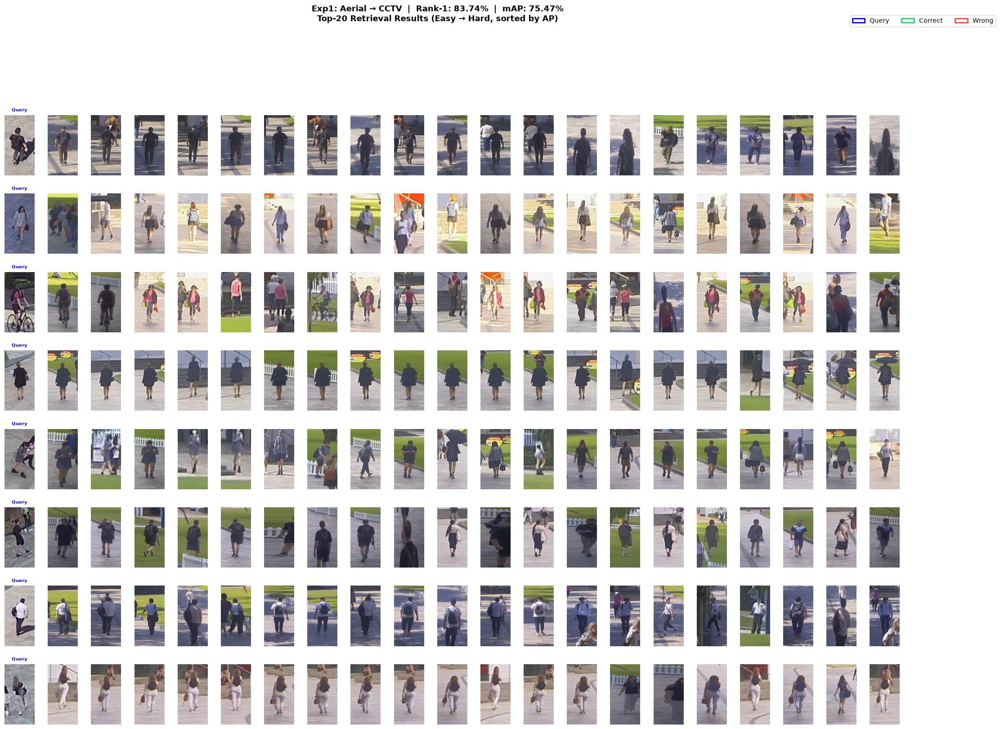

In [30]:
# Exp1: Aerial -> CCTV
visualize_protocol_retrieval(
    'Exp1: Aerial → CCTV', results['A → C'],
    n_examples=8, top_k=20,
    save_path='outputs/transreid/retrieval_exp1_A2C.png'
)

Saved: outputs/transreid/retrieval_exp2_A2W.png


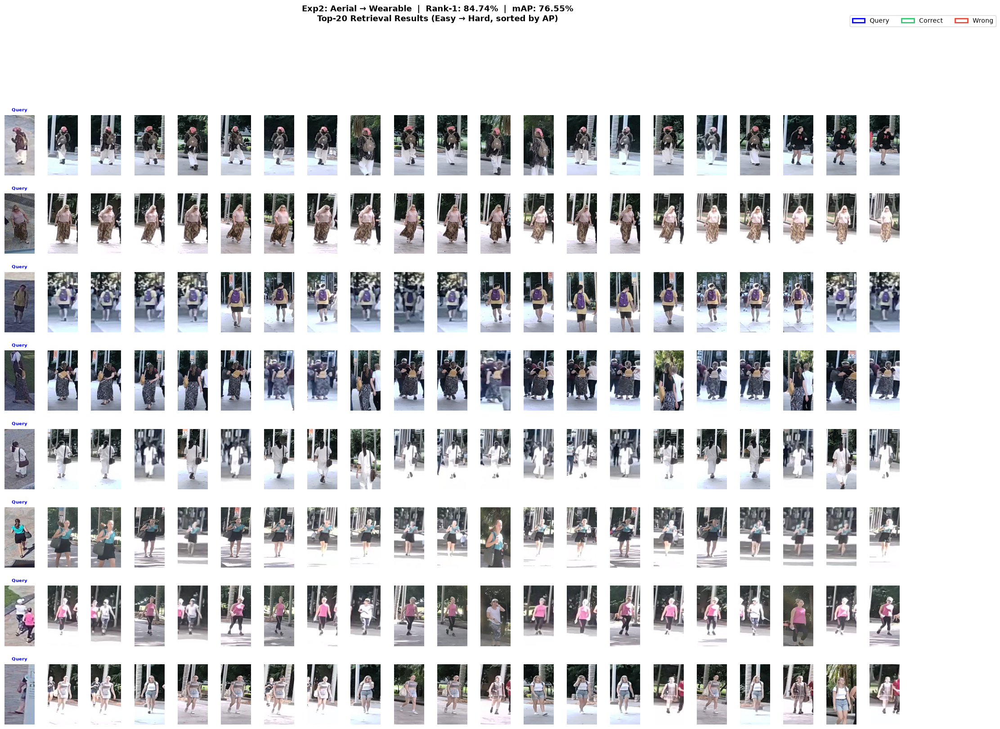

In [31]:
# Exp2: Aerial -> Wearable
visualize_protocol_retrieval(
    'Exp2: Aerial → Wearable', results['A → W'],
    n_examples=8, top_k=20,
    save_path='outputs/transreid/retrieval_exp2_A2W.png'
)

Saved: outputs/transreid/retrieval_exp4_C2A.png


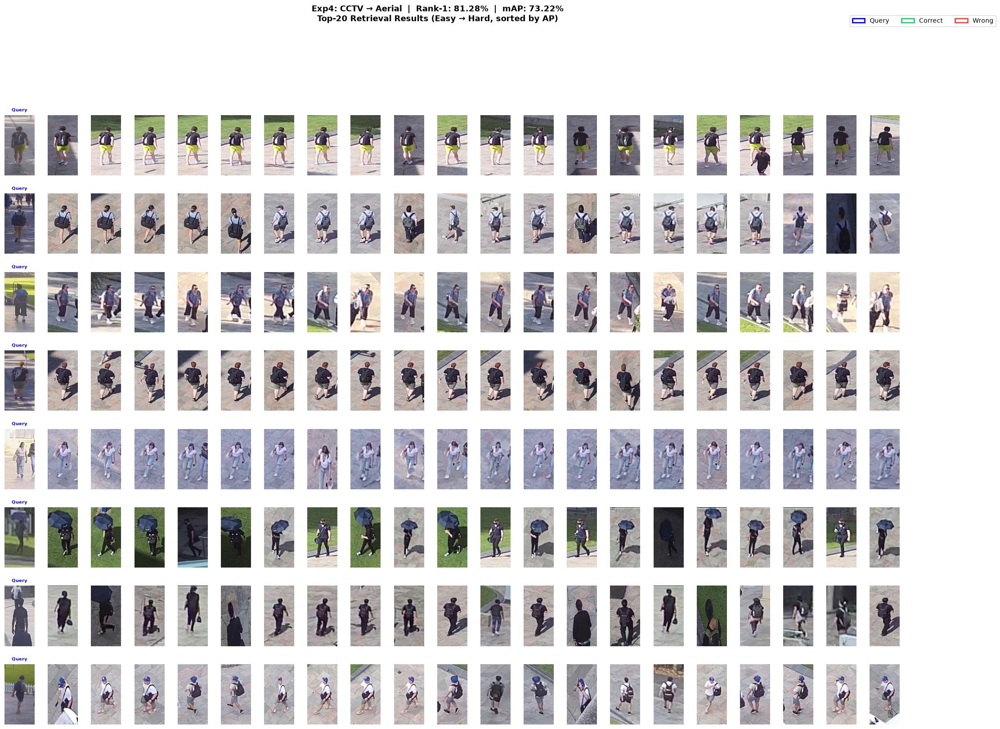

In [32]:
# Exp4: CCTV -> Aerial
visualize_protocol_retrieval(
    'Exp4: CCTV → Aerial', results['C → A'],
    n_examples=8, top_k=20,
    save_path='outputs/transreid/retrieval_exp4_C2A.png'
)

Saved: outputs/transreid/retrieval_exp5_W2A.png


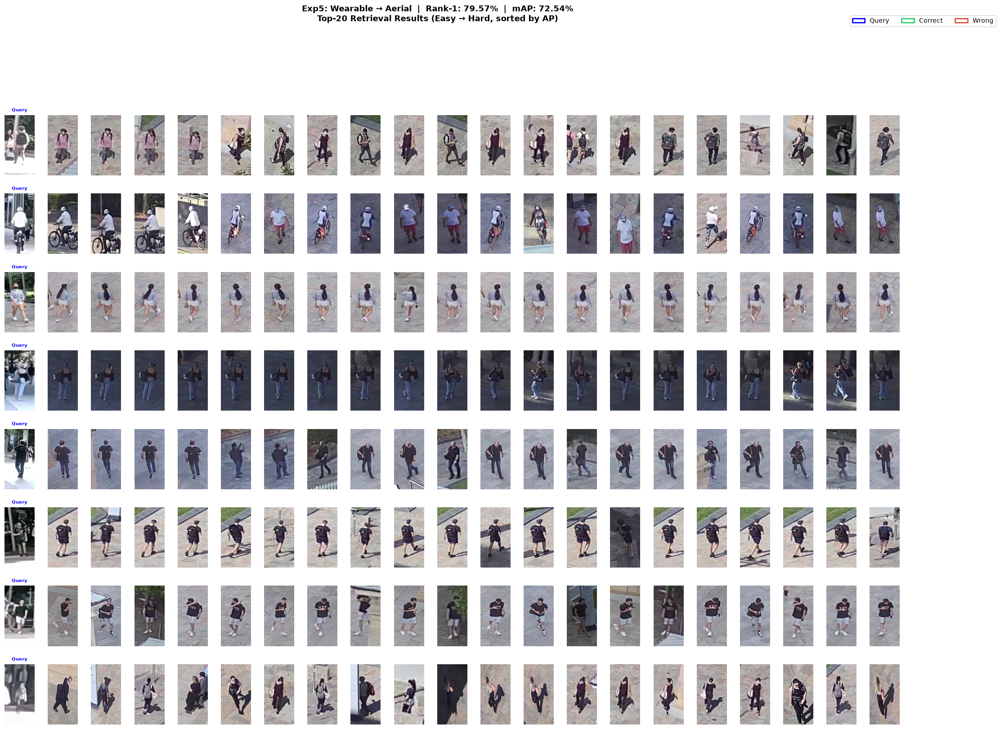

In [33]:
# Exp5: Wearable -> Aerial
visualize_protocol_retrieval(
    'Exp5: Wearable → Aerial', results['W → A'],
    n_examples=8, top_k=20,
    save_path='outputs/transreid/retrieval_exp5_W2A.png'
)

## 4. Hardest Failure Cases (All Protocols)

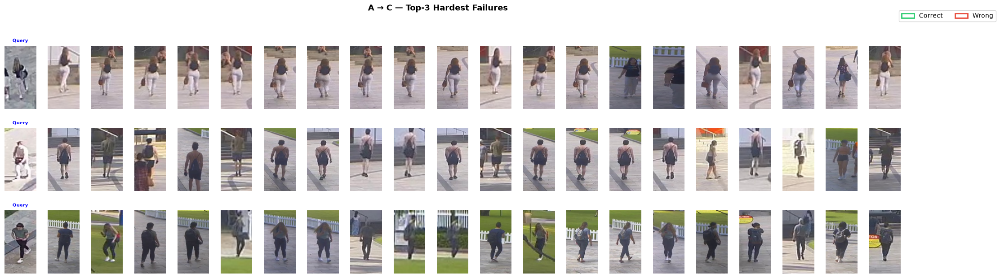

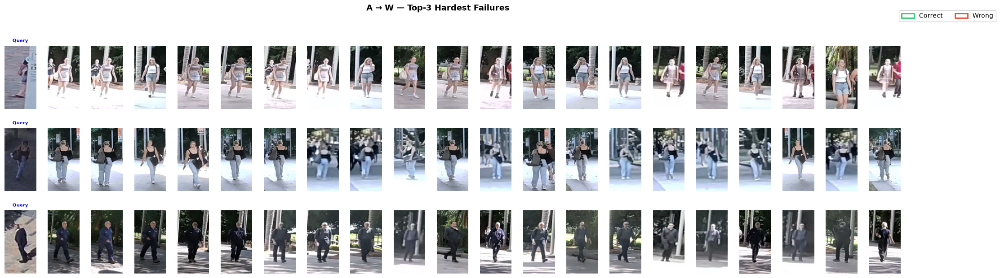

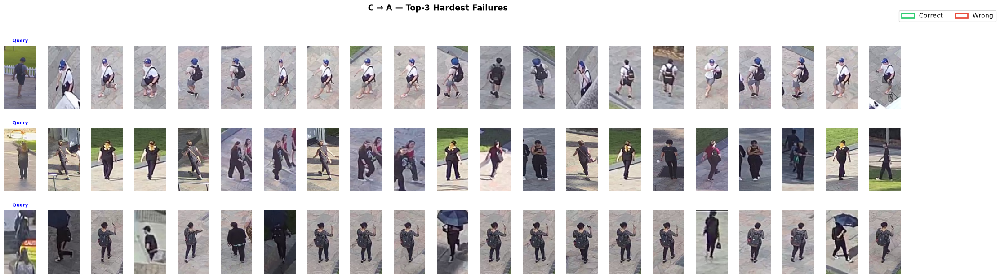

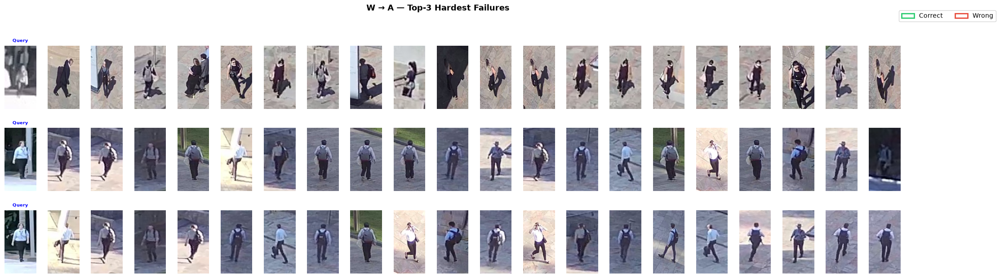

In [26]:
# Show top-3 hardest failures per protocol
for protocol_name, r in results.items():
    sorted_by_ap = np.argsort(r['per_query_ap'])  # ascending = hardest first
    n_failures = min(3, len(sorted_by_ap))

    fig, axes = plt.subplots(n_failures, 21, figsize=(26, n_failures * 2.2))
    if n_failures == 1:
        axes = axes[np.newaxis, :]

    for row in range(n_failures):
        ap_idx = sorted_by_ap[row]
        query_idx = r['valid_query_indices'][ap_idx]
        ap_val = r['per_query_ap'][ap_idx]
        show_retrieval_row(query_idx, r, top_k=20, ax_row=axes[row],
                          row_label=f'AP={ap_val:.3f}')

    green_patch = mpatches.Patch(facecolor='white', edgecolor='#2ecc71', linewidth=2, label='Correct')
    red_patch = mpatches.Patch(facecolor='white', edgecolor='#e74c3c', linewidth=2, label='Wrong')
    fig.suptitle(f'{protocol_name} — Top-3 Hardest Failures', fontsize=13, fontweight='bold', y=1.02)
    fig.legend(handles=[green_patch, red_patch], loc='upper right', fontsize=10, ncol=2, bbox_to_anchor=(0.98, 1.01))
    plt.subplots_adjust(wspace=0.05, hspace=0.3)
    safe_name = protocol_name.replace(' ', '_').replace('→', 'to')
    plt.savefig(f'outputs/transreid/failures_{safe_name}.png', dpi=150, bbox_inches='tight')
    plt.show()

## 5. t-SNE Feature Visualization

Dataset audit | train identity scheme=P+T+A | query=2,356/534 IDs | gallery=6,347/534 IDs


t-SNE on 982 samples from 15 identities...


AttributeError: module 'matplotlib.cm' has no attribute 'get_cmap'

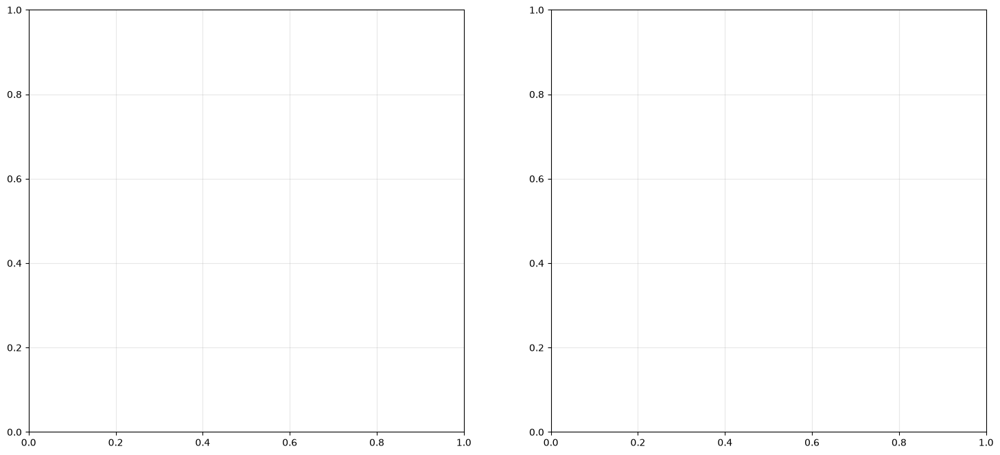

In [27]:
from sklearn.manifold import TSNE

# Use Exp1 (A->C) for t-SNE
r = results['A → C']

# Re-extract features (need raw tensors)
cfg_tsne = TransReIDConfig()
cfg_tsne.device = cfg.device
cfg_tsne.eval_txt_file = 'exp1_aerial_to_cctv.txt'
cfg_tsne.eval_batch_size = 64
cfg_tsne.strict_dataset_integrity = False
q_loader, g_loader = build_eval_loaders(cfg_tsne)

q_feats, q_pids, q_camids = extract_features(model, q_loader, cfg.device, flip_tta=cfg.flip_tta)
g_feats, g_pids, g_camids = extract_features(model, g_loader, cfg.device, flip_tta=cfg.flip_tta)

all_feats = torch.cat([q_feats, g_feats], dim=0).numpy()
all_pids = np.concatenate([q_pids, g_pids])
all_camids = np.concatenate([q_camids, g_camids])

# Select top-15 IDs
N_IDS = 15
pid_counts = defaultdict(int)
for pid in all_pids:
    pid_counts[pid] += 1
top_pids = sorted(pid_counts, key=pid_counts.get, reverse=True)[:N_IDS]

mask = np.isin(all_pids, top_pids)
sel_feats = all_feats[mask]
sel_pids = all_pids[mask]
sel_camids = all_camids[mask]

print(f't-SNE on {len(sel_feats)} samples from {N_IDS} identities...')
# sklearn >= 1.6 renamed n_iter to max_iter
try:
    tsne = TSNE(n_components=2, perplexity=30, random_state=42, max_iter=1000)
except TypeError:
    tsne = TSNE(n_components=2, perplexity=30, random_state=42, n_iter=1000)
emb_2d = tsne.fit_transform(sel_feats)

camera_names = {0: 'Aerial (C0)', 2: 'Wearable (C2)', 3: 'CCTV (C3)'}

fig, axes = plt.subplots(1, 2, figsize=(18, 8))

# By identity
cmap = plt.cm.get_cmap('tab20', N_IDS)
for i, pid in enumerate(top_pids):
    m = sel_pids == pid
    axes[0].scatter(emb_2d[m, 0], emb_2d[m, 1], c=[cmap(i)], s=25, alpha=0.7, label=f'ID {i}')
axes[0].set_title(f't-SNE by Identity (top {N_IDS} IDs)', fontsize=13)
axes[0].legend(fontsize=7, ncol=3)
axes[0].set_xticks([]); axes[0].set_yticks([])

# By camera
cam_colors = {0: '#e74c3c', 2: '#3498db', 3: '#2ecc71'}
for cam_id, color in cam_colors.items():
    m = sel_camids == cam_id
    if m.any():
        axes[1].scatter(emb_2d[m, 0], emb_2d[m, 1], c=color, s=25, alpha=0.5,
                        label=camera_names.get(cam_id))
axes[1].set_title('t-SNE by Camera View', fontsize=13)
axes[1].legend(fontsize=11)
axes[1].set_xticks([]); axes[1].set_yticks([])

plt.tight_layout()
plt.savefig('outputs/transreid/tsne_visualization.png', dpi=150, bbox_inches='tight')
plt.show()

## 6. Distance Distribution

In [ ]:
# Use A->C protocol
r = results['A → C']
distmat_ac = r['distmat']

pos_dists, neg_dists = [], []
for q_idx in range(len(r['query_pids'])):
    q_pid, q_camid = r['query_pids'][q_idx], r['query_camids'][q_idx]
    for g_idx in range(len(r['gallery_pids'])):
        g_pid, g_camid = r['gallery_pids'][g_idx], r['gallery_camids'][g_idx]
        if g_pid == q_pid and g_camid == q_camid:
            continue
        if g_pid == q_pid:
            pos_dists.append(distmat_ac[q_idx, g_idx])
        else:
            neg_dists.append(distmat_ac[q_idx, g_idx])

rng = np.random.RandomState(42)
if len(neg_dists) > 200000:
    neg_dists = list(rng.choice(neg_dists, 200000, replace=False))
pos_dists = np.array(pos_dists)
neg_dists = np.array(neg_dists)

fig, ax = plt.subplots(figsize=(12, 6))
ax.hist(pos_dists, bins=100, alpha=0.7, label=f'Positive (n={len(pos_dists):,})', color='green', density=True)
ax.hist(neg_dists, bins=100, alpha=0.7, label=f'Negative (n={len(neg_dists):,})', color='red', density=True)
ax.axvline(np.mean(pos_dists), color='darkgreen', linestyle='--', linewidth=2)
ax.axvline(np.mean(neg_dists), color='darkred', linestyle='--', linewidth=2)
ax.set_xlabel('Cosine Distance')
ax.set_ylabel('Density')
ax.set_title(f'Distance Distribution (A→C) | Pos mean={np.mean(pos_dists):.3f}, Neg mean={np.mean(neg_dists):.3f}')
ax.legend(fontsize=12)
plt.tight_layout()
plt.savefig('outputs/transreid/distance_distribution.png', dpi=150, bbox_inches='tight')
plt.show()

## 7. Summary

In [21]:
print('=' * 70)
print('  TransReID Evaluation Summary - AG-ReID.v2')
print('=' * 70)
print(f'  Backbone:    {cfg.encoder_name}')
print(f'  JPM:         {cfg.transreid_jpm} ({cfg.transreid_num_parts} parts)')
print(f'  SIE:         {cfg.transreid_sie}')
print(f'  Checkpoint:  epoch {state["epoch"]}')
print(f'  Image size:  {cfg.image_size}')
print(f'  Flip TTA:    {cfg.flip_tta}')
print('-' * 70)
print(f"  {'Protocol':<12} {'Rank-1':>8} {'Rank-5':>8} {'Rank-10':>8} {'Rank-20':>8} {'mAP':>8}")
print('-' * 70)
for name, r in results.items():
    print(f"  {name:<12} {r['cmc'][0]:>7.2%} {r['cmc'][4]:>7.2%} "
          f"{r['cmc'][9]:>7.2%} {r['cmc'][19]:>7.2%} {r['mAP']:>7.2%}")
print('=' * 70)

  TransReID Evaluation Summary - AG-ReID.v2
  Backbone:    vit_small_patch16_224.augreg_in21k_ft_in1k
  JPM:         True (4 parts)
  SIE:         True
  Checkpoint:  epoch 125
  Image size:  (256, 128)
  Flip TTA:    True
----------------------------------------------------------------------
  Protocol       Rank-1   Rank-5  Rank-10  Rank-20      mAP
----------------------------------------------------------------------
  A → C         83.74%  90.87%  93.46%  94.78%  75.47%
  A → W         84.74%  90.31%  92.30%  94.25%  76.55%
  C → A         81.28%  87.96%  89.90%  93.04%  73.22%
  W → A         79.57%  87.99%  90.98%  92.86%  72.54%
